# Social Distancing Detector
Social distancing, also called "physical distancing," means keeping a safe space between yourself and other people. To practice social or physical distancing, stay at least 6 feet / 2m from other people to reduce close contact, and thereby reducing the spread of a contagious disease (such as coronavirus)


**NOTE**:
> OpenCV social distancing detector implementation will rely on pixel distances including the CNN architecture definition, pre-trained weights, and class names.




## **The steps to build a social distancing detector:**
1. Using the YOLO object detector to detect people in the frame from your video file or directly from your webcam.
2. Determining the centroids for each detected person
3. Computing the pairwise distances between all centroids
4. Checking to see if any pairwise distances were < N pixels apart, and if so, indicating that the pair of people violated social distancing rules

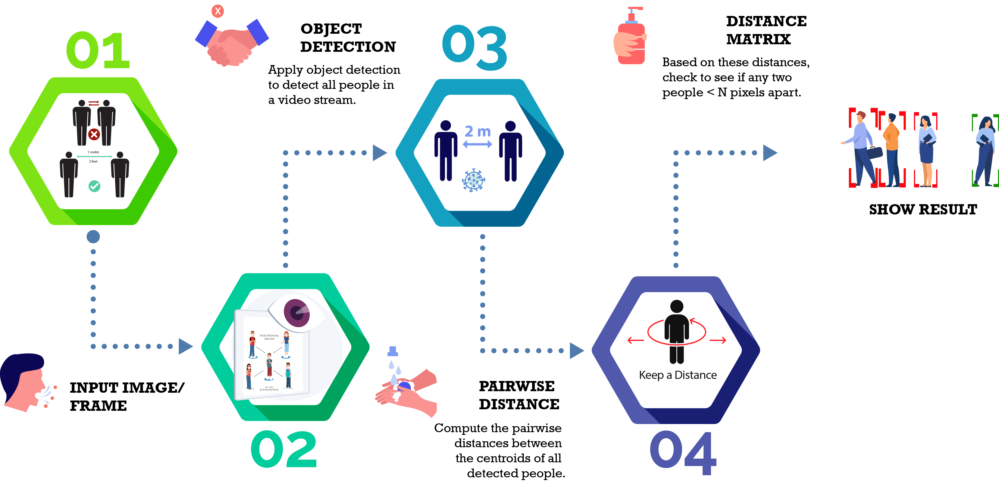

### Import Packages

In [2]:
# Import the necessary packages
from scipy.spatial import distance as dist
import matplotlib.pyplot as plt
import numpy as np
import argparse
import imutils
import cv2
import os

### Function to display images in Jupyter Notebooks and Google Colab

In [3]:
def plt_imshow(title, image):
    # Convert the image frame BGR to RGB color space and display it
	image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
	plt.imshow(image)
	plt.title(title)
	plt.grid(False)
	plt.show()

### Configuration file

- The **USE_GPU** boolean whether your NVIDIA CUDA-capable GPU will be used to speed up inference. 
- The **MIN_DISTANCE** defines the minimum distance (in pixels) that people must stay from each other in order to adhere to social distancing protocols.



In [4]:
class Config:
    # Base path to YOLO directory
    MODEL_PATH = "yolo-coco"

    # Initialize minimum probability to filter weak detections along with
    # the threshold when applying non-maxima suppression
    MIN_CONF = 0.3
    NMS_THRESH = 0.3

    # Boolean indicating if NVIDIA CUDA GPU should be used
    USE_GPU = False

    # Define the minimum safe distance (in pixels) that two people can be
    # from each other
    MIN_DISTANCE = 50

# instantiate our Config object
config = Config()

### Detecting people in images and video streams with OpenCV

Using YOLO with OpenCV requires a bit more output processing than other object detection methods (such as ingle Shot Detectors or Faster R-CNN), so in order to keep our code tidy, let's implement a detect_people function that encapsulates any YOLO object detection logic.

- detect_people utility function, which detects people in video streams using the YOLO object detector



**detect_people** function accepts 4 parameters:
1. **frame**: The frame from your video file or directly from your webcam
2. **net**: The pre-initialized and pre-trained YOLO object detection model
3. **ln**: The YOLO CNN output layer names
4. **personIdx**: The YOLO model can detect many types of objects; this index is specifically for the person class, as we won’t be considering other objects

In [5]:
def detect_people(frame, net, ln, personIdx=0):
	# Grab the dimensions of the frame and  initialize the list of results
	(H, W) = frame.shape[:2]
	results = []

  # Construct a blob from the input frame and then perform a forward
	# pass of the YOLO object detector, giving us our bounding boxes and associated probabilities
	blob = cv2.dnn.blobFromImage(frame, 1 / 255.0, (416, 416), swapRB=True, crop=False)
	net.setInput(blob)
	layerOutputs = net.forward(ln)

	# Initialize our lists of detected bounding boxes, centroids, and confidences, respectively
	boxes = []
	centroids = []
	confidences = []

    # Loop over each of the layer outputs
	for output in layerOutputs:
		# Loop over each of the detections
		for detection in output:
			# Extract the class ID and confidence (i.e., probability) of the current object detection
			scores = detection[5:]
			classID = np.argmax(scores)
			confidence = scores[classID]

			# Filter detections by (1) ensuring that the object detected was a person and (2) that the minimum
			# confidence is met
			if classID == personIdx and confidence > config.MIN_CONF:
				# Scale the bounding box coordinates back relative to
				# the size of the image, keeping in mind that YOLO
				# actually returns the center (x, y)-coordinates of
				# the bounding box followed by the boxes' width and
				# height
				box = detection[0:4] * np.array([W, H, W, H])
				(centerX, centerY, width, height) = box.astype("int")

				# Use the center (x, y)-coordinates to derive the top and left corner of the bounding box
				x = int(centerX - (width / 2))
				y = int(centerY - (height / 2))

				# update our list of bounding box coordinates, centroids, and confidences
				boxes.append([x, y, int(width), int(height)])
				centroids.append((centerX, centerY))
				confidences.append(float(confidence))

    # Apply non-maxima suppression to suppress weak, overlapping bounding boxes
	idxs = cv2.dnn.NMSBoxes(boxes, confidences, config.MIN_CONF, config.NMS_THRESH)

	# Ensure at least one detection exists
	if len(idxs) > 0:
		# Loop over the indexes we are keeping
		for i in idxs.flatten():
			# Extract the bounding box coordinates
			(x, y) = (boxes[i][0], boxes[i][1])
			(w, h) = (boxes[i][2], boxes[i][3])

			# Update our results list to consist of the person prediction probability, bounding box coordinates, and the centroid
			r = (confidences[i], (x, y, x + w, y + h), centroids[i])
			results.append(r)

	# return the list of results
	return results

### Implementing a social distancing detector with OpenCV and deep learning

In [6]:
# Construct the argument parse and parse the arguments
#ap = argparse.ArgumentParser()
#ap.add_argument("-i", "--input", type=str, default="",
#	help="path to (optional) input video file")
#ap.add_argument("-o", "--output", type=str, default="",
#	help="path to (optional) output video file")
#ap.add_argument("-d", "--display", type=int, default=1,
#	help="whether or not output frame should be displayed")
#args = vars(ap.parse_args())

# Since I'm using Jupyter Notebooks I can replace my argument
# parsing code with *hard coded* arguments and values
args = {
    "input": "pasaway_lockdown.mp4",
    "output": "output.avi",
    "display": 0
}

In [7]:
# Load the COCO class labels our YOLO model was trained on
labelsPath = os.path.sep.join([config.MODEL_PATH, "coco.names"])
LABELS = open(labelsPath).read().strip().split("\n")

# Derive the paths to the YOLO weights and model configuration
weightsPath = os.path.sep.join([config.MODEL_PATH, "yolov3.weights"])
configPath = os.path.sep.join([config.MODEL_PATH, "yolov3.cfg"])

In [8]:
# Load our YOLO object detector trained on COCO dataset (80 classes)
print("[INFO] loading YOLO from disk...")
net = cv2.dnn.readNetFromDarknet(configPath, weightsPath)

# cCeck if we are going to use GPU
if config.USE_GPU:
	# Set CUDA as the preferable backend and target
	print("[INFO] setting preferable backend and target to CUDA...")
	net.setPreferableBackend(cv2.dnn.DNN_BACKEND_CUDA)
	net.setPreferableTarget(cv2.dnn.DNN_TARGET_CUDA)

[INFO] loading YOLO from disk...


In [9]:
# Determine only the *output* layer names that we need from YOLO
ln = net.getLayerNames()
ln = [ln[i[0] - 1] for i in net.getUnconnectedOutLayers()]

# Initialize the video stream and pointer to output video file
print("[INFO] accessing video stream...")
vs = cv2.VideoCapture(args["input"] if args["input"] else 0)
writer = None

[INFO] accessing video stream...


### Check the distances among the people in the frame:

Assuming that at least two people were detected in the frame, we proceed to:
- Compute the Euclidean distance between all pairs of centroids
- Loop over the upper triangular of distance matrix (since the matrix is symmetrical)
- Check to see if the distance violates our minimum social distance set forth by public health professionals. If two people are too close, we add them to the violate set

In [10]:
# Loop over the frames from the video stream
while True:
	# Read the next frame from the file
	(grabbed, frame) = vs.read()

	# If the frame was not grabbed, then we have reached the end of the stream
	if not grabbed:
		break

	# Resize the frame and then detect people (and only people) in it
	frame = imutils.resize(frame, width=700)
	results = detect_people(frame, net, ln,
		personIdx=LABELS.index("person"))

	# Initialize the set of indexes that violate the minimum social distance
	violate = set()

    # Ensure there are *at least* two people detections (required in
	  # order to compute our pairwise distance maps)
	if len(results) >= 2:
		# Extract all centroids from the results and compute the
		# euclidean distances between all pairs of the centroids
		centroids = np.array([r[2] for r in results])
		D = dist.cdist(centroids, centroids, metric="euclidean")

		# Loop over the upper triangular of the distance matrix
		for i in range(0, D.shape[0]):
			for j in range(i + 1, D.shape[1]):
				# Check to see if the distance between any two
				# centroid pairs is less than the configured number
				# of pixels
				if D[i, j] < config.MIN_DISTANCE:
					# Update our violation set with the indexes of the centroid pairs
					violate.add(i)
					violate.add(j)

    # Loop over the results
	for (i, (prob, bbox, centroid)) in enumerate(results):
		# Extract the bounding box and centroid coordinates, then
		# initialize the color of the annotation
		(startX, startY, endX, endY) = bbox
		(cX, cY) = centroid
		color = (0, 255, 0)

		# If the index pair exists within the violation set, then update the color
		if i in violate:
			color = (0, 0, 255)

		# Draw (1) a bounding box around the person and (2) the
		# centroid coordinates of the person,
		cv2.rectangle(frame, (startX, startY), (endX, endY), color, 2)
		cv2.circle(frame, (cX, cY), 5, color, 1)

	# Draw the total number of social distancing violations on the output frame
	text = "Social Distancing Violations: {}".format(len(violate))
	cv2.putText(frame, text, (10, frame.shape[0] - 25),
		cv2.FONT_HERSHEY_SIMPLEX, 0.85, (0, 0, 255), 3)

    # Check to see if the output frame should be displayed to our screen
	if args["display"] > 0:
		# Show the output frame
		cv2.imshow("Frame", frame)
		key = cv2.waitKey(1) & 0xFF

		# If the `q` key was pressed, break from the loop
		if key == ord("q"):
			break

	# If an output video file path has been supplied and the video
	# writer has not been initialized, do so now
	if args["output"] != "" and writer is None:
		# Initialize our video writer
		fourcc = cv2.VideoWriter_fourcc(*"MJPG")
		writer = cv2.VideoWriter(args["output"], fourcc, 25,
			(frame.shape[1], frame.shape[0]), True)

	# If the video writer is not None, write the frame to the output video file
	if writer is not None:
		writer.write(frame)

# Do a bit of cleanup
vs.release()

# Check to see if the video writer point needs to be released
if writer is not None:
	writer.release()

Note that the above code block may take time to execute.

Our output video is produced in `.avi` format. First, we need to convert it to `.mp4` format.

In [ ]:
!ffmpeg -i output.avi output.mp4

### The red boxes represent people who are too close to one another.

In [12]:
#@title Display video inline
from IPython.display import HTML
from base64 import b64encode

mp4 = open("output.mp4", "rb").read()
dataURL = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % dataURL)